# Training and validation with PyRadiomics Features

### Imports

In [1]:
from __future__ import print_function
import six
import os  # needed navigate the system to get the input data
import pandas as pd
from pathlib import Path
import xgboost
from pycaret.classification import *
import ydata_profiling


%matplotlib inline
%config InlineBackend.figure_format = 'retina' #or 'retina'. Makes the images more clear
import matplotlib.pyplot as plt

import seaborn as sns
import plotly.express as px
import numpy as np




In [2]:
# create a custom function
def calculate_sensitivity(y, y_pred):
    
    tp, tn, fn, fp = 0.0,0.0,0.0,0.0
    for l,m in enumerate(y):        
        if m==y_pred[l] and m==1:
            tp+=1
        if m==y_pred[l] and m==0:
            tn+=1
        if m!=y_pred[l] and m==1:
            fn+=1
        if m!=y_pred[l] and m==0:
            fp+=1
            
    return tp/(tp+fn)

# create a custom function
def calculate_specificity(y, y_pred):
    
    tp, tn, fn, fp = 0.0,0.0,0.0,0.0
    for l,m in enumerate(y):        
        if m==y_pred[l] and m==1:
            tp+=1
        if m==y_pred[l] and m==0:
            tn+=1
        if m!=y_pred[l] and m==1:
            fn+=1
        if m!=y_pred[l] and m==0:
            fp+=1
            
    return tn/(tn+fp)

In [3]:
# params_file = 'default_params'
params_file = 'params_1.pkl'

### Load features dataset

In [4]:
# Location of feature dataset
dataset_folder = Path(os.getcwd()+'/dataset')
feature_dataset_filename = dataset_folder/Path('features')/Path(params_file)
df = pd.read_pickle(feature_dataset_filename)
print(df.shape)

df = df.drop('BraTS_MET_ID', axis=1)
df = df.dropna(axis=0, subset=['Death'])
# df["Death"] = df["Death"].astype(bool)
df["Death"] = df["Death"].astype(int)
print(df.shape)

(200, 1215)
(199, 1214)


In [5]:
df

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,Death,Infratentorial,ET_num,Nec_num,Edema_num,ET_vol,Nec_vol,Edema_vol,Nec_ET_ratio,Edema_ET_ratio
0,0.743201,0.342911,14.042317,40.950293,34.928498,40.249224,34.928498,42.379240,3955.333333,30.434283,...,0,1.0,3.0,0.0,3.0,0.458,0.000,3.469,0.000000,7.574236
1,0.786585,0.470726,39.115621,83.096308,76.026311,86.556340,94.762862,95.540567,109024.666667,65.362292,...,0,0.0,1.0,1.0,1.0,3.715,1.298,104.020,0.258927,20.750050
2,0.804832,0.676209,50.273607,74.346296,75.286121,92.541882,95.036835,96.726418,139839.000000,59.836279,...,1,0.0,1.0,1.0,1.0,9.752,6.160,124.244,0.387129,7.808195
3,0.873655,0.642660,8.244739,12.829073,12.806248,14.422205,12.649111,15.620499,731.333333,11.208178,...,1,1.0,1.0,1.0,1.0,0.345,0.071,0.425,0.170673,1.021635
4,0.755626,0.352583,39.270515,111.379385,104.690019,112.445542,105.848949,119.431989,119523.333333,84.161214,...,0,0.0,4.0,4.0,4.0,5.026,0.933,113.765,0.156570,19.091290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.666965,0.401032,58.450399,145.749926,128.062485,147.959454,154.983870,164.401946,107098.666667,97.210169,...,1,1.0,47.0,2.0,30.0,9.563,0.152,99.068,0.015646,10.197427
196,0.775088,0.509471,21.146181,41.506154,38.418745,45.650849,42.190046,48.785244,17172.666667,32.170902,...,0,0.0,1.0,1.0,1.0,0.885,0.474,16.054,0.348786,11.813098
197,0.273180,0.166535,27.351589,164.239088,116.017240,75.073298,72.801099,118.473626,23359.666667,44.866798,...,1,0.0,3.0,2.0,3.0,1.598,0.130,21.638,0.075231,12.521991
198,0.752908,0.517420,38.664430,74.725478,76.941536,88.814413,74.966659,88.904443,102216.000000,56.261406,...,0,0.0,1.0,1.0,1.0,2.147,0.467,99.474,0.178653,38.054323


In [ ]:
0 - 63%
1 - 37%

Train
0 - 87
1 - 52

Test
0 - 38
1 - 22

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


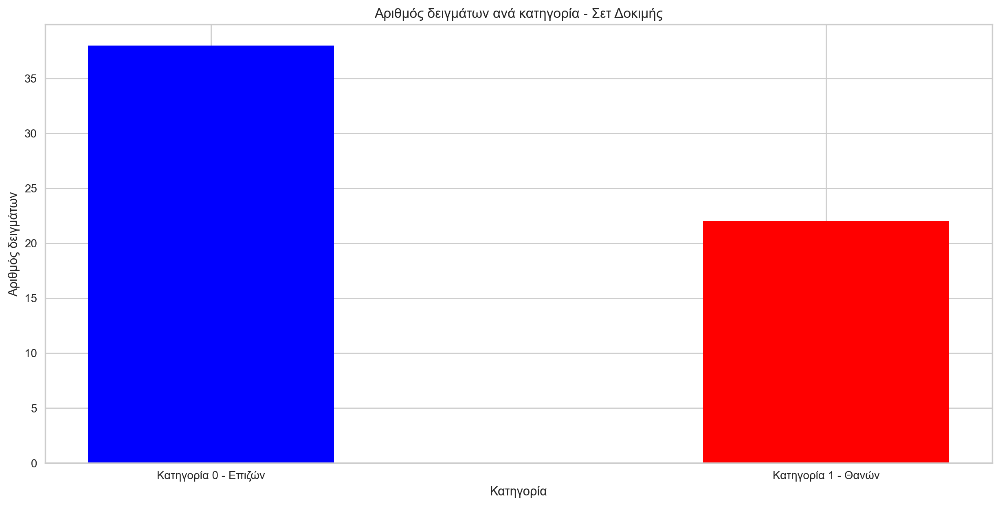

In [33]:
X = ['Κατηγορία 0 - Επιζών', 'Κατηγορία 1 - Θανών'] 
# Ygirls = [125, 74] 
# Ygirls = [87, 52] 
Ygirls = [38, 22] 
  
X_axis = [0, 1] 
  
fig = plt.figure(figsize=(15,7))

plt.bar(X_axis, Ygirls, 0.4, color=['blue', 'red']) 
  
plt.xticks(X_axis, X) 
plt.xlabel("Κατηγορία") 
plt.ylabel("Αριθμός δειγμάτων") 
# plt.title("Αριθμός δειγμάτων ανά κατηγορία") 
# plt.title("Αριθμός δειγμάτων ανά κατηγορία - Σετ Εκπαίδευσης") 
plt.title("Αριθμός δειγμάτων ανά κατηγορία - Σετ Δοκιμής") 
plt.legend() 
plt.show() 

##### OUTLIERS #####

In [7]:
def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [8]:
df_1 = df.loc[df['Death'] == 1]
df_0 = df.loc[df['Death'] == 0]

In [9]:
outliers = find_outliers_IQR(df)
outliers = outliers.notnull().sum()
outliers = dict(outliers.where(outliers>0).dropna())
sorted(outliers.items(), key=lambda kv: (kv[1], kv[0]), reverse=True)

[('wavelet-HHH_firstorder_Median', 52.0),
 ('wavelet-HHH_firstorder_Mean', 51.0),
 ('wavelet-LHH_firstorder_Median', 49.0),
 ('wavelet-HHL_firstorder_Median', 47.0),
 ('wavelet-HHH_glcm_ClusterShade', 46.0),
 ('wavelet-HHH_firstorder_RootMeanSquared', 46.0),
 ('wavelet-HLH_firstorder_Median', 41.0),
 ('wavelet-HHL_firstorder_Mean', 41.0),
 ('wavelet-LHH_glcm_ClusterShade', 40.0),
 ('wavelet-HHL_glcm_ClusterShade', 38.0),
 ('wavelet-LHH_firstorder_Mean', 37.0),
 ('wavelet-HLH_firstorder_Mean', 37.0),
 ('wavelet-HHH_glcm_Correlation', 37.0),
 ('log-sigma-5-0-mm-3D_glcm_ClusterShade', 37.0),
 ('wavelet-LLL_glszm_LargeAreaLowGrayLevelEmphasis', 36.0),
 ('wavelet-LLH_gldm_SmallDependenceLowGrayLevelEmphasis', 36.0),
 ('wavelet-LHL_glcm_ClusterShade', 36.0),
 ('log-sigma-3-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis', 36.0),
 ('log-sigma-2-0-mm-3D_glrlm_LongRunLowGrayLevelEmphasis', 36.0),
 ('wavelet-LLL_glrlm_ShortRunLowGrayLevelEmphasis', 35.0),
 ('wavelet-LLL_glrlm_LowGrayLevelRunEmp

In [27]:
f = 'log-sigma-3-0-mm-3D_gldm_LargeDependenceEmphasis'
f = 'wavelet-HHL_glrlm_ShortRunLowGrayLevelEmphasis'
f = 'wavelet-LLL_gldm_LowGrayLevelEmphasis'

In [31]:
fig = px.box(df, y=f)
fig.show()

In [29]:
fig = px.histogram(df, x=f)
fig.show()

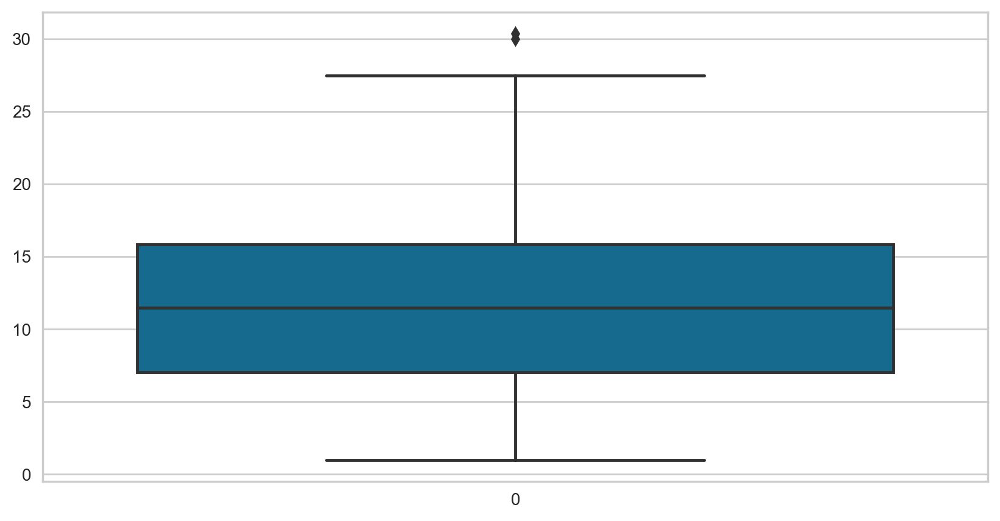

In [19]:
fig = plt.figure(figsize=(10,5))
test = sns.boxplot(df[f])
plt.show()

#### Correlation

In [33]:
df.corr()

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,Death,Infratentorial,ET_num,Nec_num,Edema_num,ET_vol,Nec_vol,Edema_vol,Nec_ET_ratio,Edema_ET_ratio
original_shape_Elongation,1.000000,0.863754,0.291197,-0.547800,0.196749,0.135350,0.121687,-0.259228,0.277468,0.263503,...,-0.042993,-0.181699,-0.057973,0.024969,-0.024467,0.205289,0.160282,0.264301,0.227453,0.203621
original_shape_Flatness,0.863754,1.000000,0.360868,-0.561725,0.180076,0.118738,0.120991,-0.283724,0.333664,0.100437,...,-0.079226,-0.203418,-0.080520,0.063634,-0.040241,0.290825,0.251736,0.304333,0.338408,0.209002
original_shape_LeastAxisLength,0.291197,0.360868,1.000000,0.433642,0.813468,0.852163,0.826575,0.680271,0.673747,0.852927,...,-0.060070,0.055085,0.476389,0.494776,0.529489,0.526304,0.351275,0.646154,0.331243,0.179131
original_shape_MajorAxisLength,-0.547800,-0.561725,0.433642,1.000000,0.411703,0.537719,0.526067,0.812240,0.164022,0.571452,...,0.035994,0.234227,0.434602,0.308682,0.437439,0.143214,0.037324,0.162683,-0.062692,-0.062453
original_shape_Maximum2DDiameterColumn,0.196749,0.180076,0.813468,0.411703,1.000000,0.794325,0.804965,0.709841,0.632587,0.762664,...,-0.029428,0.137749,0.467739,0.488181,0.539766,0.535857,0.297646,0.604555,0.319342,0.160763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ET_vol,0.205289,0.290825,0.526304,0.143214,0.535857,0.468716,0.541135,0.364812,0.624219,0.378345,...,-0.160027,-0.022561,0.165779,0.338395,0.268604,1.000000,0.530326,0.495903,0.312056,-0.117723
Nec_vol,0.160282,0.251736,0.351275,0.037324,0.297646,0.296270,0.298260,0.190769,0.493147,0.218050,...,0.027053,-0.077619,0.008315,0.283202,0.095181,0.530326,1.000000,0.358063,0.745254,-0.131275
Edema_vol,0.264301,0.304333,0.646154,0.162683,0.604555,0.641534,0.669061,0.427920,0.983254,0.509472,...,-0.123779,-0.158301,0.083783,0.320830,0.208196,0.495903,0.358063,1.000000,0.418217,0.375064
Nec_ET_ratio,0.227453,0.338408,0.331243,-0.062692,0.319342,0.292336,0.293402,0.132190,0.489730,0.172175,...,0.056796,-0.077116,-0.090523,0.346122,0.001249,0.312056,0.745254,0.418217,1.000000,0.005461


In [13]:
clf = setup(data = df,                          # The dataset we want to use
   target = 'Death',                            # The feature we want to predict
   fold = 5,                                    # Number of folds for cross-validation
   fold_strategy = 'stratifiedkfold',           # Folds methods: kfold, stratifiedkfold, groupkfold, timeseries
   train_size = 0.80,                           # Proportion of data used for training
   remove_outliers = True,                      # Remove outliers using an Isolation Forest.
   outliers_method = 'iforest',                 # Methods for outliers: iforest:Isolation Forest, ee:EllipticEnvelope, lof: LocalOutlierFactor
   normalize = True,                            # Normalize with zscore. Scale to mean 0 std 1
   normalize_method = 'zscore',                 # Methods available: zscore, minmax, maxabs, robust
   remove_multicollinearity = True,             # Features with the inter-correlations higher than the defined threshold are removed
   multicollinearity_threshold = 0.9,           # Minimum absolute Pearson correlation to identify correlated features
   fix_imbalance = False,                       # Use SMOTE (Synthetic Minority Over-sampling Technique) to create synthetic datapoints for minority class
   pca = True,                                  # Apply dimensionality reduction to project the data into a lower dimensional space 
   pca_method = 'linear',                       # PCA methods: 'linear', 'kernel', 'incremental'
   feature_selection = True,                    # Select a subset of features based on a feature importance score
   feature_selection_method = 'classic',        # Methods: 'univariate': SelectKBest, 'classic': SelectFromModel, 'sequential': SequentialFeatureSelector
   feature_selection_estimator = 'lightgbm',    # LGBClassifier is used to determine the feature importances
   n_features_to_select = 30,                  # Maximum number of features to select
   # profile=True                                 # When set, an interactive EDA report is displayed.
)


[LightGBM] [Info] Number of positive: 55, number of negative: 96
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7845
[LightGBM] [Info] Number of data points in the train set: 151, number of used features: 151
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.364238 -> initscore=-0.557015
[LightGBM] [Info] Start training from score -0.557015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

,Description,Value
0,Session id,7385
1,Target,Death
2,Target type,Binary
3,Original data shape,"(199, 1214)"
4,Transformed data shape,"(191, 31)"
5,Transformed train set shape,"(151, 31)"
6,Transformed test set shape,"(40, 31)"
7,Numeric features,1212
8,Categorical features,1
9,Rows with missing values,21.6%


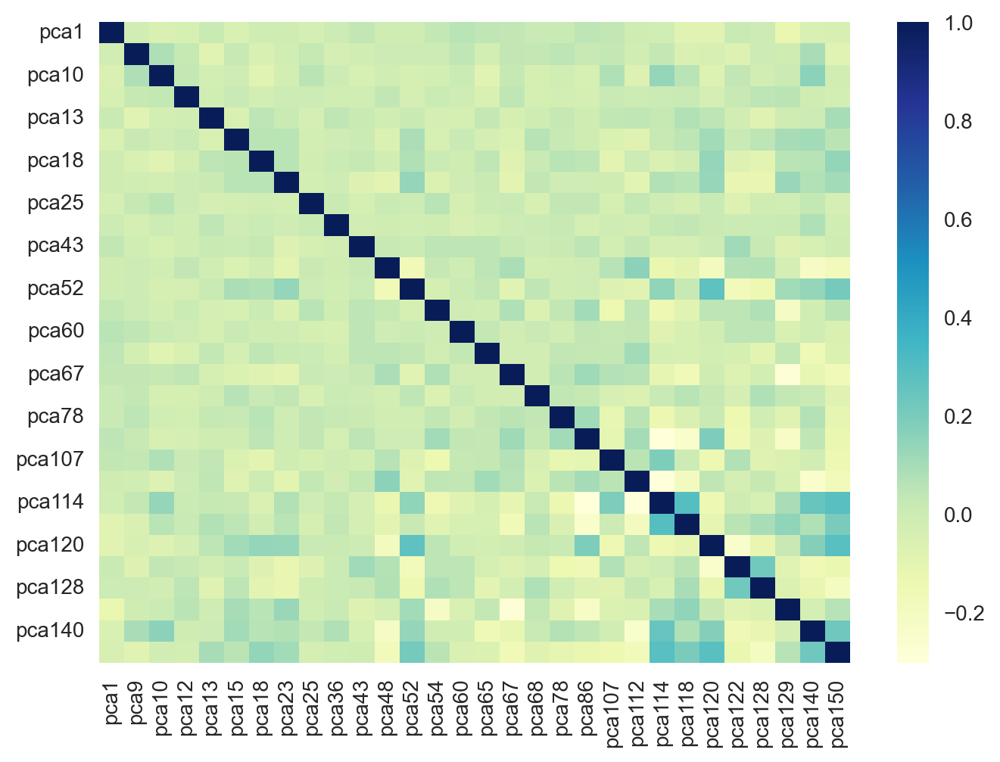

In [14]:
dataplot = sns.heatmap(clf.dataset_transformed.drop(('Death'), axis=1).corr(), cmap="YlGnBu")
# plt.show()

,pca1,pca15,pca16,pca28,pca30,pca34,pca38,pca47,pca48,pca56,...,pca79,pca91,pca96,pca99,pca102,pca119,pca123,pca149,pca150,Death
190,-1.629697,1.068190,0.597930,-1.340305,-1.082148,-1.233839,-0.940909,-1.349274,0.614176,-0.355238,...,1.141927,-0.057643,-0.344979,0.153575,-0.250385,-0.168281,-0.072783,-0.008812,6.661338e-16,0
3,5.833908,1.153140,0.862777,-2.130037,-0.475900,1.917993,-2.209722,0.903705,0.977556,0.108126,...,1.168755,-0.002956,-0.532338,-0.157563,-0.360614,-0.034365,-0.461707,0.015052,2.053913e-15,1
43,0.779317,-0.670346,-0.706589,-0.269705,0.128741,0.496949,2.646032,-0.603478,-0.736932,0.014596,...,0.072494,-0.150641,-0.138270,0.009526,-0.371683,0.446623,-0.129731,0.038250,-3.996803e-15,1
123,10.381232,0.635975,0.516289,-0.596575,-0.927225,-1.169707,-1.194592,0.322008,-0.690098,-1.399607,...,-0.182778,0.120005,0.836491,0.123015,0.275543,0.014671,-0.094564,-0.036220,-1.887379e-15,0
19,-1.505279,0.170931,-0.898652,0.288786,-0.923272,-1.862033,-1.475208,-0.269902,-2.294654,0.585683,...,-0.447958,0.080007,-0.376321,-0.278583,-0.394061,-0.108531,0.186236,-0.002009,-1.915135e-15,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,-2.041290,0.447767,-0.923223,0.678894,0.222073,0.483259,0.682768,0.690292,1.242600,-0.757338,...,-0.364800,-0.008904,0.045296,-0.333650,-0.067959,0.552395,0.225274,0.078230,-1.626647e-01,0
130,-1.257551,0.195870,0.167511,-0.533411,0.120133,-0.415675,-0.642123,-0.418480,-0.413567,-0.647998,...,0.037673,-0.195008,0.302633,0.093809,-0.271072,-0.675381,0.223684,0.024697,2.864544e-02,1
65,-6.982316,1.904509,-1.284453,-2.353727,-0.743181,2.039920,0.434188,0.208235,0.161968,-1.453342,...,0.601770,-0.178971,-0.049382,0.391728,0.036304,-0.439102,-0.157381,0.064698,-7.270333e-01,0
69,-0.171661,0.038803,1.030223,0.268271,-0.907223,0.569836,-1.479735,-1.386649,-0.265991,0.306975,...,0.028578,-0.125216,-0.463661,-0.459304,0.231089,-0.261089,0.431091,-0.317491,-4.198551e-02,0


In [48]:
clf.X_train

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,Survival,Infratentorial,ET_num,Nec_num,Edema_num,ET_vol,Nec_vol,Edema_vol,Nec_ET_ratio,Edema_ET_ratio
153,0.442526,0.425714,69.693642,163.710037,122.930878,140.684036,169.008881,177.921326,175018.671875,72.445885,...,77.733330,0.0,7.0,1.0,6.0,29.150,0.807,145.731995,0.026939,4.864706
64,0.866025,0.577350,2.666667,4.618802,4.472136,4.472136,4.472136,4.898980,31.333334,4.000000,...,92.300003,0.0,1.0,0.0,1.0,0.014,0.000,0.013000,0.000000,0.928571
46,0.815705,0.628458,41.408234,65.888565,76.655075,69.050705,79.624115,79.724525,94144.335938,53.745647,...,33.066666,1.0,1.0,1.0,1.0,10.315,3.722,79.693001,0.265156,5.677353
34,0.443727,0.122569,8.662175,70.671806,76.419891,20.396078,64.124878,78.434685,131.000000,31.358974,...,32.099998,1.0,7.0,0.0,0.0,0.200,0.000,0.000000,0.000000,0.000000
188,0.772013,0.655362,46.278660,70.615387,75.286118,78.102493,79.120163,84.498520,77635.335938,54.516018,...,80.733330,1.0,2.0,2.0,2.0,16.497,2.623,58.966999,0.137186,3.084048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,0.496802,0.331275,13.943062,42.089066,30.000000,26.076809,24.331051,98.508881,4063.666748,20.909952,...,14.433333,0.0,3.0,1.0,1.0,0.722,0.136,3.302000,0.158508,3.848485
25,0.864490,0.805909,52.035263,64.567169,108.166542,81.412529,110.018181,118.978989,114587.000000,55.817650,...,80.133331,0.0,2.0,1.0,2.0,46.729,4.977,63.175999,0.096256,1.221831
72,0.795156,0.543220,33.035206,60.813633,97.097885,74.726166,72.718636,103.227905,58087.667969,48.356312,...,23.166666,1.0,3.0,1.0,1.0,5.589,1.533,51.078999,0.215249,7.172002
44,0.457880,0.336053,9.883862,29.411646,15.231546,15.231546,13.416408,44.090816,1134.666626,13.467004,...,9.533334,0.0,2.0,0.0,1.0,0.770,0.000,0.371000,0.000000,0.481818


In [32]:
clf.X_train_transformed

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,Survival,Infratentorial,ET_num,Nec_num,Edema_num,ET_vol,Nec_vol,Edema_vol,Nec_ET_ratio,Edema_ET_ratio
81,0.876466,0.509191,41.156307,80.826889,84.403793,96.602280,92.347168,100.199799,139355.671875,70.842026,...,9.200000,0.0,1.0,1.0,1.0,1.901000,0.578000,137.341003,0.233159,55.401775
19,0.525153,0.302539,35.999786,118.992142,102.625534,79.246452,72.111023,104.938080,11995.666992,62.489101,...,4.200000,1.0,7.0,1.0,6.0,6.234000,0.042000,6.014000,0.006692,0.958254
89,0.604549,0.376203,26.498512,70.436722,101.074226,87.315521,69.771057,138.910049,14571.666992,42.582451,...,7.366667,1.0,7.0,0.0,5.0,0.888000,0.000000,13.922000,0.000000,15.677928
35,0.580276,0.330216,14.077626,42.631615,67.911705,39.849716,44.271889,68.205574,5777.333496,24.738119,...,73.633331,1.0,2.0,0.0,1.0,1.629000,0.000000,4.313000,0.000000,2.647637
122,0.737081,0.457601,31.557568,68.963005,109.635757,60.530983,88.543777,123.044708,63264.000000,50.831341,...,10.000000,1.0,4.0,2.0,3.0,23.853001,3.552000,35.814999,0.129611,1.306878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8,0.839967,0.471235,58.832359,124.847145,120.929733,165.130249,141.873184,166.024094,84521.335938,104.867546,...,15.766666,0.0,17.0,0.0,16.0,11.075000,0.000000,74.306999,0.000000,6.709435
98,0.830823,0.713040,53.775452,75.417198,89.554451,99.538940,106.150833,113.384300,143828.671875,62.658379,...,2.366667,1.0,7.0,1.0,6.0,25.745001,33.376999,84.772003,0.564544,1.433849
12,0.507087,0.186986,30.402191,162.590622,73.539108,112.587746,122.196564,153.153519,16393.333984,82.447617,...,7.733333,0.0,6.0,0.0,5.0,2.144000,0.000000,14.738000,0.000000,6.874067
15,0.621892,0.554009,37.389458,67.488869,53.814495,80.622574,80.622574,81.510735,66867.664062,41.970810,...,7.100000,0.0,2.0,2.0,2.0,9.966000,4.766000,52.345001,0.323513,3.553150


In [38]:
set(clf.X_train_transformed.columns) - set(clf.X_train.columns)

{'Ethnicity_ ',
 'Ethnicity_0',
 'Ethnicity_1',
 'Ethnicity_2',
 'Ethnicity_3',
 'Ethnicity_4'}

In [43]:
clf.X_train_transformed['Ethnicity_ ']

81     0.0
19     0.0
89     0.0
35     0.0
122    0.0
      ... 
8      0.0
98     0.0
12     0.0
15     0.0
24     0.0
Name: Ethnicity_ , Length: 151, dtype: float64

In [29]:
clf.__dict__

{'_ml_usecase': <MLUsecase.CLASSIFICATION: 1>,
 '_available_plots': {'pipeline': 'Pipeline Plot',
  'parameter': 'Hyperparameters',
  'auc': 'AUC',
  'confusion_matrix': 'Confusion Matrix',
  'threshold': 'Threshold',
  'pr': 'Precision Recall',
  'error': 'Prediction Error',
  'class_report': 'Class Report',
  'rfe': 'Feature Selection',
  'learning': 'Learning Curve',
  'manifold': 'Manifold Learning',
  'calibration': 'Calibration Curve',
  'vc': 'Validation Curve',
  'dimension': 'Dimensions',
  'feature': 'Feature Importance',
  'feature_all': 'Feature Importance (All)',
  'boundary': 'Decision Boundary',
  'lift': 'Lift Chart',
  'gain': 'Gain Chart',
  'tree': 'Decision Tree',
  'ks': 'KS Statistic Plot'},
 '_variable_keys': {'USI',
  'X',
  'X_test',
  'X_train',
  '_available_plots',
  '_ml_usecase',
  'data',
  'exp_id',
  'exp_name_log',
  'fix_imbalance',
  'fold_generator',
  'fold_groups_param',
  'fold_shuffle_param',
  'gpu_n_jobs_param',
  'gpu_param',
  'html_param',


In [ ]:
# import dtale
# d = dtale.show(df)
# d.open_browser()

In [ ]:
# d.kill()

In [10]:
clf = setup(data = df,                          # The dataset we want to use
   target = 'Death',                            # The feature we want to predict
   fold = 5,                                    # Number of folds for cross-validation
   fold_strategy = 'stratifiedkfold',           # Folds methods: kfold, stratifiedkfold, groupkfold, timeseries
   train_size = 0.80,                           # Proportion of data used for training
   normalize = True,                            # Normalize with zscore. Scale to mean 0 std 1
   normalize_method = 'zscore',                 # Methods available: zscore, minmax, maxabs, robust
   remove_outliers = True,                      # Remove outliers using an Isolation Forest.
   outliers_method = 'iforest',                 # Methods for outliers: iforest:Isolation Forest, ee:EllipticEnvelope, lof: LocalOutlierFactor
   remove_multicollinearity = True,             # Features with the inter-correlations higher than the defined threshold are removed
   multicollinearity_threshold = 0.9,           # Minimum absolute Pearson correlation to identify correlated features
   fix_imbalance = False,                       # Use SMOTE (Synthetic Minority Over-sampling Technique) to create synthetic datapoints for minority class
   pca = True,                                  # Apply dimensionality reduction to project the data into a lower dimensional space 
   pca_method = 'linear',                       # PCA methods: 'linear', 'kernel', 'incremental'
   feature_selection = True,                    # Select a subset of features based on a feature importance score
   feature_selection_method = 'classic',        # Methods: 'univariate': SelectKBest, 'classic': SelectFromModel, 'sequential': SequentialFeatureSelector
   feature_selection_estimator = 'lightgbm',    # LGBClassifier is used to determine the feature importances
   n_features_to_select = 20,                  # Maximum number of features to select
   # profile=True                                 # When set, an interactive EDA report is displayed.
)


[LightGBM] [Info] Number of positive: 56, number of negative: 95
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7848
[LightGBM] [Info] Number of data points in the train set: 151, number of used features: 151
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370861 -> initscore=-0.528525
[LightGBM] [Info] Start training from score -0.528525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

,Description,Value
0,Session id,2044
1,Target,Death
2,Target type,Binary
3,Original data shape,"(199, 1214)"
4,Transformed data shape,"(191, 21)"
5,Transformed train set shape,"(151, 21)"
6,Transformed test set shape,"(40, 21)"
7,Numeric features,1212
8,Categorical features,1
9,Rows with missing values,21.6%


In [13]:
clf.dataset_transformed

,pca14,pca16,pca25,pca28,pca41,pca43,pca49,pca55,pca57,pca58,...,pca93,pca95,pca98,pca109,pca115,pca116,pca117,pca122,pca123,Death
125,0.530908,1.402805,-0.501028,-0.155721,-0.636558,0.306936,0.229824,-1.494314,0.112170,0.851964,...,-0.355809,-0.409951,0.227588,0.410164,-0.021845,0.355260,-0.106027,0.085161,-0.022170,0
126,-1.667799,0.996892,0.586556,-0.712319,0.448223,0.454834,-0.635898,-0.098743,0.774790,-0.326838,...,0.106137,0.563132,0.057449,0.131133,0.003530,-0.064454,0.276414,-0.019141,0.232195,0
38,-3.875244,1.913978,0.663161,1.299938,2.114543,1.195182,0.786485,-0.366551,0.406806,1.047273,...,0.219436,-0.402846,-0.066530,0.056247,0.140936,-0.029895,-0.028270,0.074791,-0.109432,0
83,-0.739817,-2.074714,0.622946,-0.337092,-0.983057,0.427805,0.072120,-1.426769,-0.480362,-1.454546,...,-0.364241,-0.222101,-0.429614,-0.491737,-0.010275,-0.037726,0.371634,-0.207408,-0.361869,1
10,2.154341,-0.515145,-1.509049,-1.764311,-0.174541,-0.585166,1.022273,1.775340,-0.489297,-0.292884,...,-0.454024,0.106229,0.752194,-0.098420,0.272353,-0.061210,-0.084652,-0.131090,0.145265,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,1.508294,0.947494,-0.312035,-1.840193,2.568938,-2.034803,1.439958,-0.436779,-0.097366,-0.300927,...,0.047155,0.698812,-0.024581,-0.251073,0.735663,-0.043795,-0.259675,-0.330119,-0.393945,1
190,0.039387,0.803487,-0.140137,-1.400278,0.616010,-0.879829,-1.635697,0.412424,-0.136560,0.492707,...,-0.759444,0.593545,0.011604,-0.440883,-0.293706,0.053715,0.444400,0.509736,-0.232509,0
175,1.280232,-0.241604,0.800749,0.318873,-0.098369,-0.743125,0.767324,0.685747,0.453493,0.198484,...,-0.333469,-0.704286,0.609628,-0.761496,0.444367,-0.247746,0.961336,-0.426710,-0.509658,0
188,-1.549886,1.712469,1.740336,0.883773,0.707127,0.467947,-0.933952,0.227713,-0.179091,-0.395432,...,0.661281,0.106878,0.084221,-1.112147,-0.423413,-0.531013,-0.636097,0.515514,-0.784717,0


In [14]:
# ydata_profiling.ProfileReport(clf.data.sample(20, axis=1))
report = ydata_profiling.ProfileReport(clf.dataset_transformed)

In [15]:
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# add Specificity to metrics
add_metric('spec', 'Specificity', calculate_specificity)
# add Sensitivity to metrics
add_metric('sens', 'Sensitivity', calculate_sensitivity)
include = list(models().axes[0])

# top3 = compare_models(include = ['xgboost', 'catboost', 'lightgbm', 'ada', 'et', 'mlp', 'dt', 'ridge', 'lr'], sort='Prec.', n_select=3)
# top3 = compare_models(include = ['svm', 'ridge', 'lr'], sort='AUC', n_select=3)
# top3 = compare_models(include = ['xgboost', 'catboost', 'lightgbm', 'ada'], sort='Prec.', n_select=3)
top3 = compare_models(include = include, sort='Sensitivity', n_select=3)

In [ ]:
# evaluate_model(top3[1])

plot_model(top3[0], 'confusion_matrix')
plot_model(top3[1], 'confusion_matrix')
plot_model(top3[2], 'confusion_matrix')

In [ ]:
def tune(model):
    return tune_model(
        estimator = model,       # Model to tune
        choose_better = True,    # Return the best possible model
      #   verbose = True           # Display data
        n_iter = 20,             # Try n searches for better parameters
        optimize = 'Accuracy',      # The metric to optimize
)

In [ ]:
blender = blend_models(top3, verbose=False, optimize='Sensitivity')
stacker = stack_models(top3, verbose=False, optimize='Sensitivity')
tuned_top3 = [tune_model(i, verbose=False, optimize='Sensitivity') for i in top3]
# tuned_top3 = [tune(i) for i in top3]
blender_tuned = blend_models(tuned_top3, verbose=False, optimize='Sensitivity')
stacker_tuned = stack_models(tuned_top3, verbose=False, optimize='Sensitivity')

In [ ]:
plot_model(blender_tuned, 'confusion_matrix')
plot_model(stacker_tuned, 'confusion_matrix')
plot_model(blender, 'confusion_matrix')
plot_model(stacker, 'confusion_matrix')
plot_model(tuned_top3[0], 'confusion_matrix')
plot_model(tuned_top3[1], 'confusion_matrix')
plot_model(tuned_top3[2], 'confusion_matrix')

In [ ]:
tuned_blender_tuned = tune(blender_tuned)
# tuned_stacker_tuned = tune(stacker_tuned)
# tuned_blender = tune(blender)
# tuned_stacker = tune(stacker)
# tuned_best = tune(best)

In [ ]:
evaluate_model(top3[1])
# evaluate_model(blender_tuned)
# evaluate_model(stacker_tuned)
# evaluate_model(blender)
# evaluate_model(stacker)
# evaluate_model(best)

In [ ]:
best = blender
evaluate_model(best)

In [ ]:
predict_model(best)

#### Retrain the model on the whole dataset

In [ ]:
finalize_model(best)

#### Save model and data

In [ ]:
session_name = 'blender-lightgbm-catboost-xgboost'

In [ ]:
models_folder = Path(os.getcwd()+'/models')

session_folder = models_folder/session_name

if not os.path.exists(session_folder): # Create directory if doesn't exist
    os.mkdir(session_folder)

# Save train datasets
get_config('X_train').to_pickle(session_folder/'X_train.pkl')
get_config('X_train_transformed').to_pickle(session_folder/'X_train_transformed.pkl')

# Save test datasets
get_config('X_test').to_pickle(session_folder/'X_test.pkl')
get_config('X_test_transformed').to_pickle(session_folder/'X_test_transformed.pkl')

# Save the model pipeline to a pickle file
save_model(best, rf'{session_folder}/model_{session_name}')

In [ ]:
dashboard(best)

In [ ]:
evaluate_model(top3[0])